In [1]:
import altair as alt
import json

In [2]:
%%html
<style>
@import url('https://fonts.googleapis.com/css?family=Ubuntu|Ubuntu+Condensed|Ubuntu+Mono');
</style>

In [3]:
%run theme.py

In [4]:
with open("../data/interim/ACS_ca_BAs2012-2016.geojson", "r") as file:
    ca_data = json.load(file)

In [5]:
data = alt.Data(values = ca_data['features'])

In [6]:
base = alt.Chart(data).mark_geoshape(stroke = 'black', strokeWidth = .5, fill = '#FCFCFC').encode().properties(width = 1080, height = 1350, title = "% of adults (25-34) with at least a B.A.")

In [7]:
choro = alt.Chart(data).mark_geoshape(stroke = 'black', strokeWidth = .5, fill = '#FCFCFC').encode(
    color = alt.Color('properties.Share of BA:Q', title = '', legend = alt.Legend(format = '%'), scale = alt.Scale(scheme = 'oranges', type = "bin-linear"))
).properties(width = 1080, height = 1350)

In [8]:
labels = alt.Chart(data).mark_text(baseline='top', fill = 'black', align = 'center', stroke = "white", strokeWidth = 0.05, dy = -10).encode(
         longitude='properties.centroid_lon:Q',
         latitude='properties.centroid_lat:Q',
         text='properties.value_text:O',
         size=alt.value(10),
         opacity=alt.value(1),
).properties(width = 1080, height = 1350)

In [9]:
names = alt.Chart(data).mark_text(baseline='bottom', fill = 'black', align = 'center', strokeWidth=0.01, stroke='white').encode(
         longitude='properties.centroid_lon:Q',
         latitude='properties.centroid_lat:Q',
         text='properties.NAME:O',
         size=alt.value(10),
         opacity=alt.value(1),
).properties(width = 1080, height = 1350)

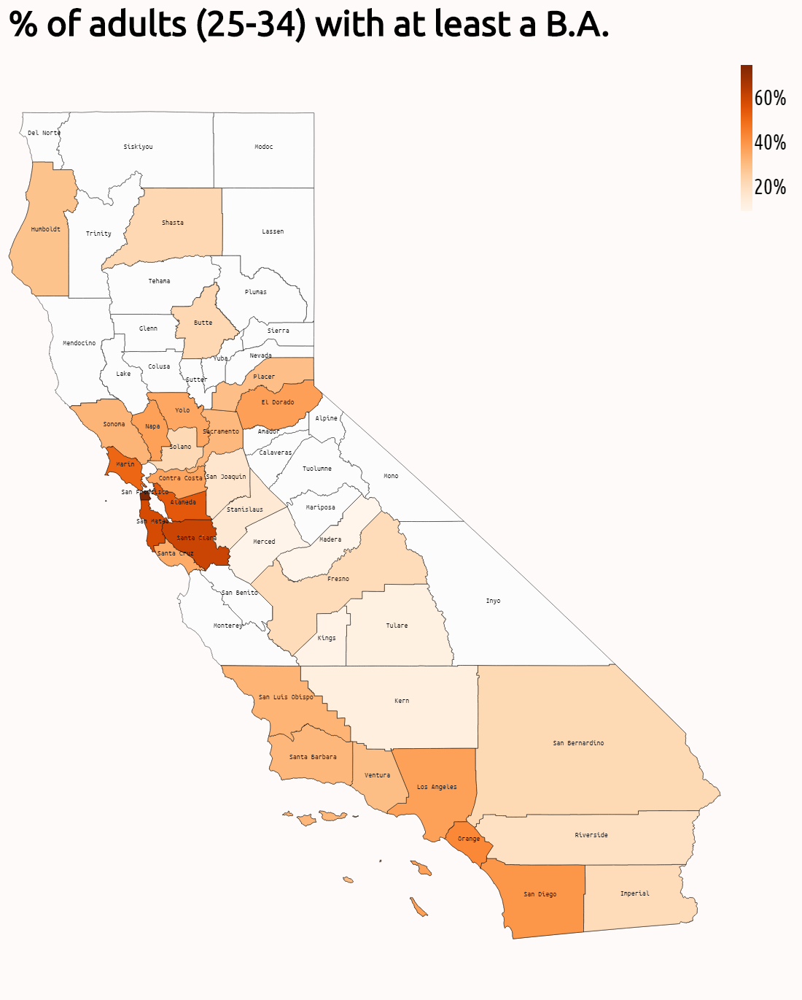

In [10]:
base + choro + names